## choropleth maps

This Jupyter notebook reads in a multi-sheet Excel file of food desert data generated by the USDA, and a shapefile of US county data from the United States Census Tigerline files.  It creates separate Pandas DataFrames for each of the worksheets, that contain data on access to grocery stores and restaurants, demographic information, and presence of different types of agricultural prodcuts.

The script merges the geometry data for the counties, in a Pandas GeoDataFrame, with three of the food desert Pandas DataFrames, and then creates a series of choropleth maps.   The maps examine lack of access to grocery stores nationally, and then for Ohio.  They also examine demographic and poverty data that has been associated in the literature with the presence of food deserts for Ohio only, and also examine farmers' markets in Ohio.

The figures generated for each map, and for each linear regression in the second part, are saved in an output_data folder.

The notebook originally used an API call to the US Census Bureau to get a json of the US counties geometries, but the server was subject to intermitten lack of availabiily, so the script was modified to use a local shapefile downloaded from the US Census Bureau instead.

This script requires a number of very specific packages be installed, including GeoPandas, plotly express, and fiona.  It also requires that an environment variable be set for PROJ_LIB for pyproj.  As is noted on the package website, installation of geopandas can be complicated and the cleanest thing to do is to create a new conda enviroment for geospatial work, and conda install geopandas there.  It will install a lenghty list of other dependencies, including fiona.  Although some of its webpages indicate that Fiona is compatible with python 3.7 and no later, other webpages explain that it is compatible with python 3.9.  If there are any issues with Fiona not being found, pip install Fiona in the geospatial environment.  In addition, to save the dynamic maps, this notebook requres orca to be installed in the environment where it is run.  


In [1]:
# Dependencies and Setup

import string
from pathlib import Path

# Turn off warning messages
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import geopandas as gpd
import fiona 
import matplotlib.pyplot as plt
from pathlib import Path
from scipy import stats
import json

# path for the api_keys file
import sys
sys.path.append("../")

import plotly.express as px
import plotly.graph_objects as go

import os
import pyproj


In [2]:
# input files to load

food_data_to_load = Path("input_data/FoodDesertDownload.xls")

counties_to_load = Path("input_data/UScounties.shp")


# read in the multi-sheet Excel food desert data

dict_df = pd.read_excel(food_data_to_load,
                         sheet_name=["Read_Me",
                                     "Variable List", 
                                     "Supplemental Data - County",
                                    "Supplemental Data - State",
                                    "ACCESS",
                                     "STORES",
                                     "RESTAURANTS",
                                     "ASSISTANCE",
                                     "INSECURITY",
                                     "PRICES_TAXES",
                                     "LOCAL",
                                     "HEALTH",
                                     "SOCIOECONOMIC"
                                    ])

# split the data into DataFrames by type

stores_df = dict_df.get("STORES")
access_df = dict_df.get("ACCESS")
restaurants_df = dict_df.get("RESTAURANTS")
insecurity_df = dict_df.get("INSECURITY")
prices_taxes_df = dict_df.get("PRICES_TAXES")
local_df = dict_df.get("LOCAL")
health_df = dict_df.get("HEALTH")
socioeconomic_df = dict_df.get("SOCIOECONOMIC")

supp_states_df = dict_df.get("Supplemental Data - State")
supp_county_df = dict_df.get("Supplemental Data - County")
variables_df = dict_df.get("Variable List")


In [3]:
# load the shapefile for the county polygons

counties_df = gpd.read_file(counties_to_load)
counties_df.head()

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,geometry
0,Lake of the Woods,Minnesota,27,077,27077,"POLYGON ((-95.34283 48.54668, -95.34105 48.715..."
1,Ferry,Washington,53,019,53019,"POLYGON ((-118.85163 47.94956, -118.84846 48.4..."
2,Stevens,Washington,53,065,53065,"POLYGON ((-117.43883 48.04412, -117.54219 48.0..."
3,Okanogan,Washington,53,047,53047,"POLYGON ((-118.97209 47.93915, -118.97406 47.9..."
4,Pend Oreille,Washington,53,051,53051,"POLYGON ((-117.43858 48.99992, -117.03205 48.9..."


In [4]:
# Create a dictionary for mapping variable codes and names for the access DataFrame

access_vars = (variables_df[(variables_df["Category Code"] == "ACCESS")])

access_var_dict = access_vars.loc[:, ["Variable Name", "Variable Code"]]

access_var_dict

,Variable Name,Variable Code
0,"Population, low access to store, 2010",LACCESS_POP10
1,"Population, low access to store, 2015",LACCESS_POP15
2,"Population, low access to store (% change), 20...",PCH_LACCESS_POP_10_15
3,"Population, low access to store (%), 2010",PCT_LACCESS_POP10
4,"Population, low access to store (%), 2015",PCT_LACCESS_POP15
5,"Low income & low access to store, 2010",LACCESS_LOWI10
6,"Low income & low access to store, 2015",LACCESS_LOWI15
7,"Low income & low access to store (% change), 2...",PCH_LACCESS_LOWI_10_15
8,"Low income & low access to store (%), 2010",PCT_LACCESS_LOWI10
9,"Low income & low access to store (%), 2015",PCT_LACCESS_LOWI15


In [5]:
# Create a dictionary mapping column IDs to names from the access_var_dict DataFrame
# This column mapping code is from ChatGPT

column_mapping = dict(zip(access_var_dict['Variable Code'], access_var_dict['Variable Name']))

# Rename the columns in the acceses_df DataFrame based on the mapping
# This will make the mouseover meaningful to the user
access_df = access_df.rename(columns=column_mapping)

# Print the updated DataFrame
access_df.head()


,FIPS,State,County,"Population, low access to store, 2010","Population, low access to store, 2015","Population, low access to store (% change), 2010 -15","Population, low access to store (%), 2010","Population, low access to store (%), 2015","Low income & low access to store, 2010","Low income & low access to store, 2015",...,"Hispanic ethnicity, low access to store, 2015","Hispanic ethnicity, low access to store (%), 2015","Asian, low access to store, 2015","Asian, low access to store (%), 2015","American Indian or Alaska Native, low access to store, 2015","American Indian or Alaska Native, low access to store (%), 2015","Hawaiian or Pacific Islander, low access to store, 2015","Hawaiian or Pacific Islander, low access to store (%), 2015","Multiracial, low access to store, 2015","Multiracial, low access to store (%), 2015"
0,1001,AL,Autauga,18428.439685,17496.693038,-5.056026,33.769657,32.062255,5344.427472,6543.676824,...,471.136164,0.863345,86.767975,0.159000,61.169869,0.112092,8.817961,0.016159,482.848633,0.884808
1,1003,AL,Baldwin,35210.814078,30561.264430,-13.204891,19.318473,16.767489,9952.144027,9886.831137,...,1377.874834,0.755973,212.946378,0.116833,181.649648,0.099662,14.819634,0.008131,1127.696098,0.618712
2,1005,AL,Barbour,5722.305602,6069.523628,6.067799,20.840972,22.105560,3135.676086,2948.790251,...,509.377525,1.855183,17.096410,0.062266,39.960527,0.145539,8.082376,0.029436,462.382655,1.684025
3,1007,AL,Bibb,1044.867327,969.378841,-7.224696,4.559753,4.230324,491.449066,596.162829,...,8.596762,0.037516,1.994318,0.008703,2.513097,0.010967,0.000000,0.000000,5.259244,0.022951
4,1009,AL,Blount,1548.175559,3724.428242,140.568857,2.700840,6.497380,609.027708,1650.959482,...,497.489891,0.867886,8.428994,0.014705,28.938242,0.050484,1.062851,0.001854,202.914187,0.353990


In [6]:
# Explode the array column in the Pandas DataFrame access_df for merging with the geoDataFrame counties_df
# This solution to trying to merge an obj and an int was suggested in chatGPT

exploded_df = access_df.explode('FIPS')

# explode the FIPS codefor local and socieconomic DataFrames

soe_exploded_df = socioeconomic_df.explode('FIPS')
loc_exploded_df = local_df.explode('FIPS')

In [7]:
# Convert the shared column FIPS in the counties_df GeoDataFrame to int 

counties_merge_df = counties_df

counties_merge_df['FIPS'] = counties_merge_df['FIPS'].astype(int)


In [8]:
# merge based on the exploded FIPS column and the converted FIPS column in the GeoPandas DataFrame
# chatGPT, plotly documentation pages, and Towards Data Science articles were referenced about the merge

merged_final_df = counties_merge_df.merge(exploded_df, left_on='FIPS', right_on='FIPS')



In [9]:
# merge based on the exploded FIPS column and the converted FIPS column in the GeoPandas DataFrame
# for the socioeconOmic data

soe_merged_final_df = counties_merge_df.merge(soe_exploded_df, left_on='FIPS', right_on='FIPS')

In [10]:
# Merge based on the exploded FIPS column and the converted FIPS column in the GeoPandas DataFrame
# for the local farm data

local_merged_final_df = counties_merge_df.merge(loc_exploded_df, left_on='FIPS', right_on='FIPS')


In [11]:
# Separate out states for mapping

lower_48_df = merged_final_df[(merged_final_df["STATE_NAME"] != "Alaska") & (merged_final_df["STATE_NAME"]  != "Hawaii")]

alaska_df = merged_final_df[(merged_final_df["STATE_NAME"] == "Alaska")]

hawaii_df = merged_final_df[merged_final_df["STATE_NAME"] == "Hawaii"]

ohio_df = merged_final_df[merged_final_df["STATE_NAME"] == "Ohio"]


# farm and orchard data for Ohio Only
ohio_loc_df = local_merged_final_df[local_merged_final_df["STATE_NAME"] == "Ohio"]


# Detailed socioeconomic data for Ohio only
ohio_soe_df = soe_merged_final_df[soe_merged_final_df["STATE_NAME"] == "Ohio"]

lower_48_df.head()

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,geometry,State,County,"Population, low access to store, 2010","Population, low access to store, 2015",...,"Hispanic ethnicity, low access to store, 2015","Hispanic ethnicity, low access to store (%), 2015","Asian, low access to store, 2015","Asian, low access to store (%), 2015","American Indian or Alaska Native, low access to store, 2015","American Indian or Alaska Native, low access to store (%), 2015","Hawaiian or Pacific Islander, low access to store, 2015","Hawaiian or Pacific Islander, low access to store (%), 2015","Multiracial, low access to store, 2015","Multiracial, low access to store (%), 2015"
0,Lake of the Woods,Minnesota,27,077,27077,"POLYGON ((-95.34283 48.54668, -95.34105 48.715...",MN,Lake of the Woods,1665.974721,1665.974721,...,7.000000,0.173053,15.000000,0.370828,17.917537,0.442955,0.000000,0.000000,29.000000,0.716934
1,Ferry,Washington,53,019,53019,"POLYGON ((-118.85163 47.94956, -118.84846 48.4...",WA,Ferry,3695.031746,3669.290511,...,149.111988,1.974732,25.379270,0.336105,1161.974253,15.388349,6.789612,0.089917,256.736789,3.400037
2,Stevens,Washington,53,065,53065,"POLYGON ((-117.43883 48.04412, -117.54219 48.0...",WA,Stevens,12902.494248,12942.728928,...,434.493138,0.998123,59.803685,0.137382,1873.677288,4.304237,24.120101,0.055409,610.062803,1.401444
3,Okanogan,Washington,53,047,53047,"POLYGON ((-118.97209 47.93915, -118.97406 47.9...",WA,Okanogan,6505.309003,7261.648672,...,975.072218,2.371285,35.866711,0.087224,538.915813,1.310593,5.849181,0.014225,737.743685,1.794124
4,Pend Oreille,Washington,53,051,53051,"POLYGON ((-117.43858 48.99992, -117.03205 48.9...",WA,Pend Oreille,4298.665756,4404.192959,...,103.779539,0.798243,21.702840,0.166932,348.968202,2.684164,6.000000,0.046150,146.478044,1.126668


## Choropleth maps of United States residents with low access to grocery stores

### Continental United States

In [12]:
# create Choropleth map for the lower 48 states of percent of pop with low access to grocery stores
# Display separately from Alaska and Hawaii so detail can be shown with "albers usa" projection


fig = px.choropleth(lower_48_df, geojson=lower_48_df.geometry, 
                    locations=lower_48_df.index, color='Population, low access to store (%), 2015',
                    height=500,  
                    width = 800,
                    projection='albers usa',
                    color_continuous_scale = px.colors.sequential.YlOrRd)

# configure and display the map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Population With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Don't display country coastlines for North America
# resolution can be at 110m or 50m, use more detail
fig.update_geos(resolution=50,
                showcoastlines=False,
                showland = False)

# zoom to around Kansas, center of the continental US

fig.update_layout(geo=dict(center=dict(lat=39, lon=-98)))

fig.update_geos(showsubunits=True, subunitcolor='white', subunitwidth=1.5)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure
fig.write_image("output_data/fig1_lower_48_access.png", engine='orca')


#Display map

fig.show()

### Alaska

In [13]:
# create Choropleth map for Alaska of percent of pop with low access to grocery stores

fig = px.choropleth(alaska_df, geojson=alaska_df.geometry, 
                    locations=alaska_df.index, color='Population, low access to store (%), 2015',
                    height=500,  
                    width = 800,
                    projection='albers usa',
                    color_continuous_scale = px.colors.sequential.YlOrRd)
                    #color_continuous_scale = px.colors.sequential.Aggrnyl)
                    #color_continuous_scale = px.colors.sequential.matter)
                   
                    #color_continuous_scale = px.colors.diverging.BrBG)


# configure and display the Alaska map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Alaska Population With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Don't display country coastlines for North America
fig.update_geos(resolution=50,
                showcoastlines=False,
                showland = False)

fig.update_geos(showsubunits=True, subunitcolor='white', subunitwidth=1.5)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig2_alaska_access.png", engine='orca')

# display map    
fig.show()

### Hawaii

In [14]:
# create Choropleth map for Hawaii of percent of pop with low access to grocery stores

fig = px.choropleth(hawaii_df, geojson=hawaii_df.geometry, 
                    locations=hawaii_df.index, color='Population, low access to store (%), 2015',
                    height=500,  
                    width = 800,
                    projection='albers usa',
                    color_continuous_scale = px.colors.sequential.YlOrRd)
                    #color_continuous_scale = px.colors.sequential.Aggrnyl)
                    #color_continuous_scale = px.colors.sequential.matter)
                   
                    #color_continuous_scale = px.colors.diverging.BrBG)

# configure and display the Hawaii map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Hawaii Population With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Don't display country coastlines for North America
fig.update_geos(resolution=50,
                showcoastlines=False,
                showland = False)


fig.update_geos(showsubunits=True, subunitcolor='white', subunitwidth=1.5)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure
fig.write_image("output_data/fig3_hawaii_access.png", engine='orca')


# dipslay map  
fig.show()

### Ohio

In [15]:
# create Choropleth map for Obio of percent of pop with low access to grocery stores

# change projection from Albers USA to keep 90 aligment of state with top of figure

fig = px.choropleth(ohio_df, geojson=ohio_df.geometry, 
                    locations=ohio_df.index, color='Population, low access to store (%), 2015',
                    height=400,  
                    width = 800,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.YlOrRd)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Ohio Population With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle

fig.update_geos(resolution=110,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure
fig.write_image("output_data/fig4_ohio_access.png", engine='orca')


# Show the map

fig.show()

### Ohio residents with low access to grocery stores, by race

In [16]:
# create Choropleth map for Obio of percent of White pop with low access to grocery stores

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_df, geojson=ohio_df.geometry, 
                    locations=ohio_df.index, color='White, low access to store (%), 2015',
                    height=400,  
                    width = 700,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.algae)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of White Residents With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig5_ohio_white_access.png", engine='orca')

# Show the map

fig.show()

In [17]:
# create Choropleth mapof percentage of Black pop with low access to grocery stores

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_df, geojson=ohio_df.geometry, 
                    locations=ohio_df.index, color='Black, low access to store (%), 2015',
                    height=400,  
                    width = 700,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.algae)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Black Residents With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig6_ohio_black_access.png", engine='orca')


# Show the map

fig.show()

In [18]:
# create Choropleth map for Obio of percent of Hispanic residents with low access to grocery stores

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_df, geojson=ohio_df.geometry, 
                    locations=ohio_df.index, color='Hispanic ethnicity, low access to store (%), 2015',
                    height=400,  
                    width = 700,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.algae)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Hispanic Residents With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle and is not appropriate for a single sate in continental US

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig7_ohio_hispanic_access.png", engine='orca')

# Show the map

fig.show()

In [19]:
# create Choropleth map for Obio of percent of Asian residents with low access to grocery stores

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_df, geojson=ohio_df.geometry, 
                    locations=ohio_df.index, color='Asian, low access to store (%), 2015',
                    height=400,  
                    width = 700,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.algae)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percentage of Asian Residents With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle because the state is relatively small and "albers uS" is not appropriate

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig8_ohio_asian_access.png", engine='orca')


# Show the map
fig.show()

In [20]:
# create Choropleth map for Native American and Alaska Native residents with low access to grocery stores

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_df, geojson=ohio_df.geometry, 
                    locations=ohio_df.index, color='American Indian or Alaska Native, low access to store (%), 2015',
                    height=400,  
                    width = 800,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.algae)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='% of American Indians and Alaska Natives With Limited Access to Grocery Stores 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'% Limited Access'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle and is not appropriate for a single sate in continental US

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig9_ohio_indian_access.png", engine='orca')


# Show the map

fig.show()

### Ohio Poverty levels

In [21]:
# create Choropleth map for percentage of Ohio residents in poverty

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_soe_df, geojson=ohio_soe_df.geometry, 
                    locations=ohio_soe_df.index, color='POVRATE15',
                    height=400,  
                    width = 600,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.Sunset)

# configure and display the Ohio map

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Ohio Percentage of Population in Poverty 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'Poverty Rate'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle and is not appropriate for a single sate in continental US

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)

# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure

fig.write_image("output_data/fig10_ohio_poverty_rates.png", engine='orca')

# Show the map

fig.show()

### Ohio Access to Farmers Markets

In [22]:
# create Choropleth map for access to farmers markets

# change projection from Albers USA to keep proper alignment of state without distorion

fig = px.choropleth(ohio_loc_df, geojson=ohio_loc_df.geometry, 
                    locations=ohio_loc_df.index, color='FMRKTPTH16',
                    height=400,  
                    width = 600,
                    projection='mercator',
                    color_continuous_scale = px.colors.sequential.YlGnBu)

# configure and display the Ohio map

# farmer's market data is for 2009 and 2016, differnt than grocery store access data
fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Number of Farmers\' Markets Per 1000 People, 2016')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'Mkts per 1000'})

# Updare layout.  With "Mercator" projection, a box will generate around the individual state within the 48
# continental states, because it projects beyond the state, but the "albers usa" projection will
# distort the state to appear at an angle and is not appropriate for a single sate in continental US

fig.update_geos(resolution=50,
                showcountries = True,
                countrycolor = "white",
                showsubunits = True,
                subunitcolor= "white",
                subunitwidth = 1,
                showcoastlines=False,
                showland = False)


# Save ouput.  The figure will be created in the output directory if it
# does not exist, and overwritten if it does but the output_data directory 
# must exist before the code is run.

# Save the figure
fig.write_image("output_data/fig11_ohio_famers_markets.png", engine='orca')

# Show the map

fig.show()

## Correlation Analyses Across the US

In [23]:
insec_df = insecurity_df
soc_df = socioeconomic_df
access_df = dict_df.get("ACCESS")
assist_df = dict_df.get("ASSISTANCE")
merge_df = insec_df.merge(soc_df,on='FIPS',how='outer').merge(access_df).merge(stores_df).merge(assist_df)
total_df = merge_df.dropna(axis='rows')
total_df.to_csv("input_data/total_df.csv",index=False)
total_df.head()

,FIPS,State_x,County_x,FOODINSEC_10_12,FOODINSEC_13_15,CH_FOODINSEC_12_15,VLFOODSEC_10_12,VLFOODSEC_13_15,CH_VLFOODSEC_12_15,FOODINSEC_CHILD_01_07,...,REDEMP_WICS08,REDEMP_WICS12,PCH_REDEMP_WICS_08_12,PCT_WIC09,PCT_WIC15,PCH_WIC_09_15,PCT_CACFP09,PCT_CACFP15,PCH_CACFP_09_15,FDPIR12
1,1003,AL,Baldwin,17.9,17.6,-0.3,6.8,7.3,0.5,8.5,...,125840.5,126639.4,0.634881,2.990417,2.719352,-0.271065,0.91609,1.055597,0.139507,0
4,1009,AL,Blount,17.9,17.6,-0.3,6.8,7.3,0.5,8.5,...,102945.9,149110.0,44.843050,2.990417,2.719352,-0.271065,0.91609,1.055597,0.139507,0
6,1013,AL,Butler,17.9,17.6,-0.3,6.8,7.3,0.5,8.5,...,134613.5,203713.2,51.331930,2.990417,2.719352,-0.271065,0.91609,1.055597,0.139507,0
7,1015,AL,Calhoun,17.9,17.6,-0.3,6.8,7.3,0.5,8.5,...,126327.7,148999.4,17.946660,2.990417,2.719352,-0.271065,0.91609,1.055597,0.139507,0
8,1017,AL,Chambers,17.9,17.6,-0.3,6.8,7.3,0.5,8.5,...,154673.6,161957.1,4.708968,2.990417,2.719352,-0.271065,0.91609,1.055597,0.139507,0


In [24]:
# Define a function to create Linear Regression plots
def regression_plot(x,y,a,b):
    (slope,intercept,rvalue,pvalue,stderr) = stats.linregress(x,y)
    line = "y = "+str(round(slope,2))+"x + "+str(round(intercept,2))
    plt.scatter(x,y)
    plt.plot(x,x*slope+intercept,"r-")
    plt.annotate(line,(a,b),fontsize=15,color="red")
    print("The r-value is: " + str(rvalue))

## Data Pooling

The r-value is: 0.8040290649474247


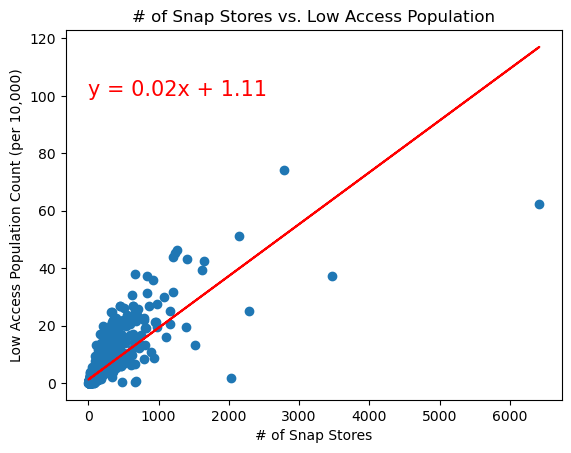

In [25]:
# By SNAP
regression_plot(total_df['SNAPS16'],total_df['LACCESS_POP15']/10000,0,100)
plt.title('# of Snap Stores vs. Low Access Population')
plt.xlabel('# of Snap Stores')
plt.ylabel('Low Access Population Count (per 10,000)')
plt.gcf()  # make current fig
plt.savefig('output_data/Snap_v_LAccess')
plt.show()

The r-value is: 0.7248436880841129


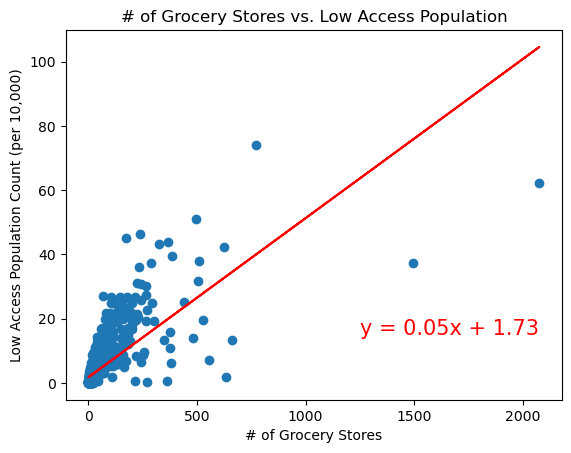

In [26]:
# By Grocery Stores
regression_plot(total_df['GROC14'],total_df['LACCESS_POP15']/10000,1250,15)
plt.title('# of Grocery Stores vs. Low Access Population')
plt.xlabel('# of Grocery Stores')
plt.ylabel('Low Access Population Count (per 10,000)')
plt.gcf()  # make current fig
plt.savefig('output_data/Groc_v_LAccess')
plt.show()

The r-value is: 0.8783343694774579


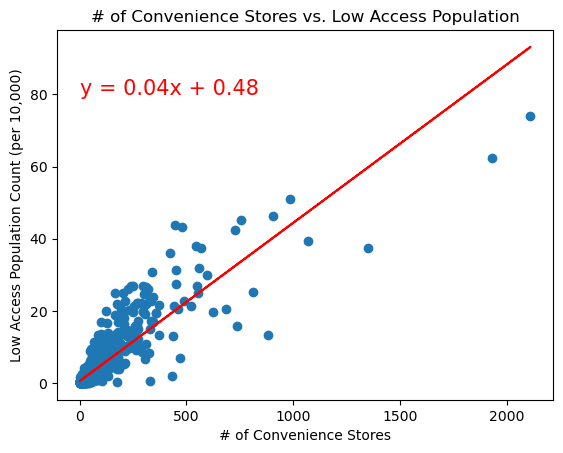

In [27]:
# By Conv Stores
regression_plot(total_df['CONVS14'],total_df['LACCESS_POP15']/10000,0,80)
plt.title('# of Convenience Stores vs. Low Access Population')
plt.xlabel('# of Convenience Stores')
plt.ylabel('Low Access Population Count (per 10,000)')
plt.gcf()  # make current fig
plt.savefig('output_data/Conv_v_LAccess')
plt.show()

The r-value is: -0.005842527529028026


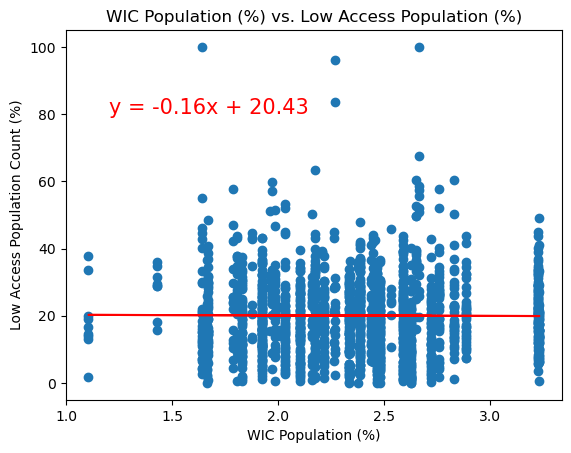

In [28]:
# By WIC
regression_plot(total_df['PCT_WIC15'],total_df['PCT_LACCESS_POP15'],1.2,80)
plt.title('WIC Population (%) vs. Low Access Population (%)')
plt.xlabel('WIC Population (%)')
plt.ylabel('Low Access Population Count (%)')
plt.gcf()  # make current fig
plt.savefig('output_data/WIC_v_LAccess')
plt.show()

In [29]:
#Function to plot regressions across multiple groups
def MultiRegression_plot(x,Y,Labels):
    slopes = []
    intercepts = []
    r_vals = []
    y_values = []
    count = 0
    for y in Y:
        (slope,intercept,rvalue,pvalue,stderr) = stats.linregress(x,y)
        slopes.append(slope)
        intercepts.append(intercept)
        r_vals.append(rvalue)
        y_data = x*slope+intercept
        plt.plot(x,x*slope+intercept)
        count = count +1
    global Results
    Results = pd.DataFrame({"Race":Labels, "Slope":slopes,"Intecept":intercepts,"R Value":r_vals})

    

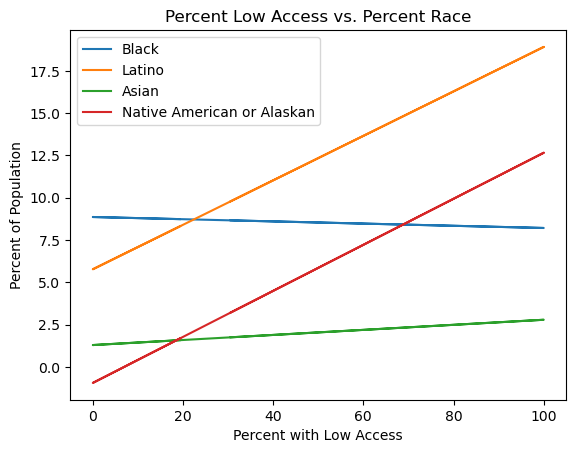

In [30]:
#Make the 4 regressions by race
MultiRegression_plot(total_df['PCT_LACCESS_POP10'],[total_df['PCT_NHBLACK10'],total_df['PCT_HISP10'],total_df['PCT_NHASIAN10'],total_df['PCT_NHNA10']],['Black','Latino','Asian','Native American or Alaskan'])
plt.title('Percent Low Access vs. Percent Race')
plt.legend(['Black','Latino','Asian','Native American or Alaskan'])
plt.ylabel("Percent of Population")
plt.xlabel("Percent with Low Access")
plt.gcf()  # make current fig
plt.savefig('output_data/P_LAccess_v_Race')
plt.show()

In [31]:
Results.head()

,Race,Slope,Intecept,R Value
0,Black,-0.006487,8.857131,-0.006184
1,Latino,0.131446,5.766964,0.132494
2,Asian,0.014952,1.287713,0.064494
3,Native American or Alaskan,0.136069,-0.951196,0.224572
